In [1]:
import torch.nn as nn
import torch
import torch.nn.functional as F
from torchvision import transforms, models
import PIL
import pandas as pd
import numpy as np
import os
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets import ImageFolder
from sklearn.model_selection import train_test_split
import kagglehub
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
def load_dataset(link):

  path = kagglehub.dataset_download(link)
  print("Downloaded")
  return path


dataset = load_dataset("pacificrm/skindiseasedataset")

Downloaded


In [3]:
path = os.path.join(dataset, 'SkinDisease', 'SkinDisease', 'train')
full_dataset = ImageFolder(path)

In [4]:
image_size = (224, 224)
train_transformer = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.RandomHorizontalFlip(0.5),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.RandomRotation(degrees=10),
    transforms.RandomErasing(p=0.5, scale=(0.02, 0.33), ratio=(0.3, 3.3), value=0, inplace=False),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1)),
    transforms.RandomGrayscale(p=0.2),
    transforms.RandomInvert(p=0.2),
    transforms.ConvertImageDtype(torch.float32),
    transforms.Normalize(mean=[0.485]*3, std=[0.229] * 3),
])


val_transformer = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.ConvertImageDtype(torch.float32),
    transforms.Normalize(mean = [0.485]*3, std = [0.229]*3),
   ])


test_transformer = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.ConvertImageDtype(torch.float32),
    transforms.Normalize(mean = [0.485]*3, std = [0.229]*3),
   ])

In [5]:
image_paths = [s[0] for s in full_dataset.samples]
image_labels = [s[1] for s in full_dataset.samples]

In [6]:
train_images, val_images, train_labels, val_labels = train_test_split(
    image_paths, image_labels, test_size = 0.1, random_state= 43, stratify= image_labels)
reverse = {vars: keys for keys, vars in full_dataset.class_to_idx.items()}
idx_to_class = {value:key for key, value in full_dataset.class_to_idx.items()}
classes = list(full_dataset.class_to_idx.keys())

/tmp/ipython-input-7-552832510.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = train_labels, palette = 'Set1')
/tmp/ipython-input-7-552832510.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = val_labels, palette = 'Set1')


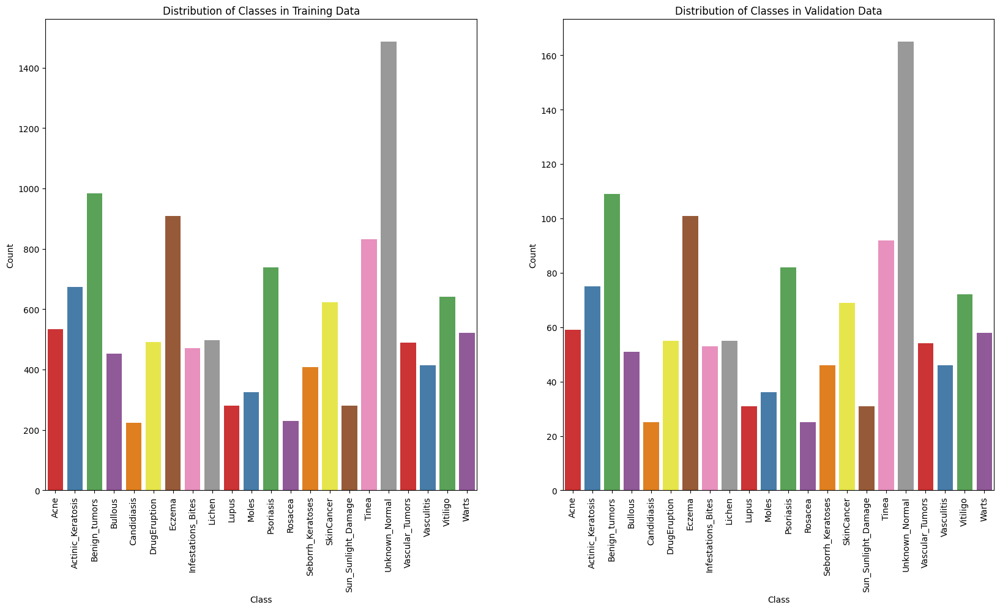

In [7]:
plt.figure(figsize = (20, 10))
plt.subplot(1, 2, 1)
sns.countplot(x = train_labels, palette = 'Set1')
plt.xticks(ticks=np.unique(train_labels), labels=[reverse[i] for i in np.unique(train_labels)], rotation=90)
plt.xlabel("Class")
plt.ylabel("Count")
plt.title("Distribution of Classes in Training Data")
plt.subplot(1, 2, 2)
sns.countplot(x = val_labels, palette = 'Set1')
plt.xticks(ticks=np.unique(val_labels), labels=[reverse[i] for i in np.unique(val_labels)], rotation=90)
plt.xlabel("Class")
plt.ylabel("Count")
plt.title("Distribution of Classes in Validation Data")
plt.show();


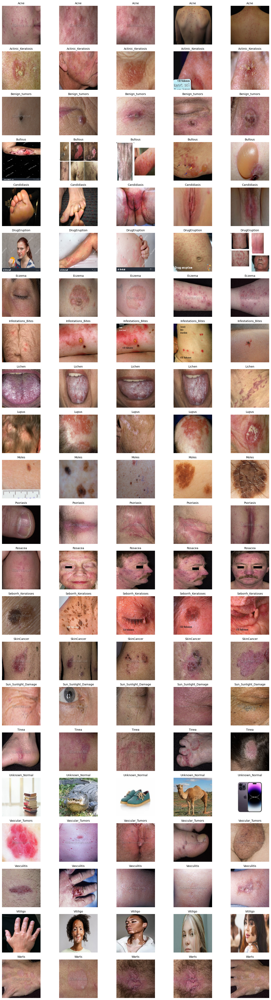

In [ ]:
num_classes_per_disease = 5
counter = 1
fig = plt.figure(figsize = (15, 50))
for idx, clas in enumerate(classes):
    shown = 0
    for j in full_dataset.samples:
        if j[1]== idx:
            image_read = plt.imread(j[0])
            image_resized = cv2.resize(image_read, image_size)
            ax = fig.add_subplot(22, 5, counter)
            ax.imshow(image_resized)
            ax.set_title(clas, fontsize = 10)
            plt.axis('off')
            counter+=1
            shown+=1
            if shown == num_classes_per_disease:
                break


plt.tight_layout()

plt.show();



In [8]:
from PIL import Image
class SkinDataset(Dataset):
  def __init__(self, images, labels, transformer):
    super(SkinDataset, self).__init__()

    self.images = images
    self.labels = labels
    self.transformer = transformer


  def __getitem__(self, idx):
    img = Image.open(self.images[idx]).convert('RGB')
    img = self.transformer(img)
    label = self.labels[idx]
    return img, label

  def __len__(self):
    return len(self.images)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [9]:
train_dataset = SkinDataset(train_images, train_labels, train_transformer)
val_dataset = SkinDataset(val_images, val_labels, val_transformer)
train_loader = DataLoader(train_dataset, shuffle = True, batch_size = 64, num_workers= 4)
val_loader = DataLoader(val_dataset, shuffle = False, batch_size = 16, num_workers= 4)

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [10]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_labels),
    y=train_labels
)

weights = torch.tensor(class_weights, dtype=torch.float).to(device)
losses = []
accuracies = []
val_accuracies = []
val_losses = []

In [11]:
new_model = models.efficientnet_b0(pretrained=True)
class CustomModel(nn.Module):
  def __init__(self, new_model):
    super(CustomModel, self).__init__()
    self.model = new_model
    self.model.classifier[1]= nn.Linear(self.model.classifier[1].in_features, len(full_dataset.class_to_idx))

  def forward(self, x):
    return self.model(x)
model = CustomModel(new_model).to(device)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 97.3MB/s]


In [12]:
checkpoint_path = 'best_model.pth'
criterion = nn.CrossEntropyLoss(weight= weights)
optimizer = torch.optim.Adam(model.parameters(), lr = 0.001)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode = 'max', factor = 0.5, patience = 2)

num_epochs = 20
counter, best = 0.0, 0.0
best_accuracy = 0.0
for epoch in range(num_epochs):
    running_loss = 0.0
    correct = 0
    total = 0

    model.train()
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)

        y_pred = model(xb)

        loss = criterion(y_pred, yb)

        optimizer.zero_grad()

        loss.backward()
        optimizer.step()


        running_loss += loss.item()


        _, predicted = torch.max(y_pred, 1)
        correct += (predicted == yb).sum().item()
        total += yb.size(0)


    avg_loss = running_loss / len(train_loader)
    accuracy = 100 * correct / total

    losses.append(avg_loss)
    accuracies.append(accuracy)


    model.eval()
    val_running_loss = 0.0
    val_correct = 0
    val_total = 0
    with torch.no_grad():
        for xb_val, yb_val in val_loader:
            xb_val, yb_val = xb_val.to(device), yb_val.to(device)

            y_pred_val = model(xb_val)

            val_loss = criterion(y_pred_val, yb_val)

            val_running_loss += val_loss.item()
            _, predicted_val = torch.max(y_pred_val, 1)
            val_correct += (predicted_val == yb_val).sum().item()
            val_total += yb_val.size(0)

    avg_val_loss = val_running_loss / len(val_loader)
    scheduler.step(avg_val_loss)
    val_accuracy = 100 * val_correct / val_total

    if val_accuracy > best_accuracy:
        best_accuracy = val_accuracy
        torch.save(model.state_dict(), checkpoint_path)
        print("Best Model saved.")
        counter = 0

    else:
      counter+=1
      if counter > 5:
        print("Early stopping")
        break

    val_accuracies.append(val_accuracy)
    val_losses.append(avg_val_loss)


    print(f"Epoch [{epoch+1}/{num_epochs}] - Loss: {avg_loss:.4f} - Accuracy: {accuracy:.2f}% - Val Loss: {avg_val_loss:.4f} - Val Accuracy: {val_accuracy:.2f}%")
#model.load_state_dict(torch.load(checkpoint_path))

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Best Model saved.
Epoch [1/20] - Loss: 2.2287 - Accuracy: 35.08% - Val Loss: 1.6778 - Val Accuracy: 48.63%
Best Model saved.
Epoch [2/20] - Loss: 1.7534 - Accuracy: 47.59% - Val Loss: 1.4729 - Val Accuracy: 55.76%
Best Model saved.
Epoch [3/20] - Loss: 1.5330 - Accuracy: 53.08% - Val Loss: 1.3745 - Val Accuracy: 59.28%
Best Model saved.
Epoch [4/20] - Loss: 1.3668 - Accuracy: 57.71% - Val Loss: 1.2991 - Val Accuracy: 60.72%
Best Model saved.
Epoch [5/20] - Loss: 1.0369 - Accuracy: 66.98% - Val Loss: 1.0884 - Val Accuracy: 66.69%
Best Model saved.
Epoch [6/20] - Loss: 0.8934 - Accuracy: 71.28% - Val Loss: 1.1049 - Val Accuracy: 68.71%
Best Model saved.
Epoch [7/20] - Loss: 0.7846 - Accuracy: 74.42% - Val Loss: 1.0413 - Val Accuracy: 71.87%
Best Model saved.
Epoch [8/20] - Loss: 0.5946 - Accuracy: 80.44% - Val Loss: 0.9966 - Val Accuracy: 72.81%
Best Model saved.
Epoch [9/20] - Loss: 0.5146 - Accuracy: 82.79% - Val Loss: 0.9983 - Val Accuracy: 74.96%
Epoch [10/20] - Loss: 0.4551 - Accura

In [ ]:
torch.save({
    'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': criterion,
    'train_losses': losses,
    'train_accuracies': accuracies,
    'val_losses': val_losses,
    'val_accuracies': val_accuracies,
    'num_epochs': num_epochs,
}, 'checkpoint.pth')

In [13]:
model.load_state_dict(torch.load(checkpoint_path))
torch.save(model.cpu().state_dict(), 'skin_disease_model_state_dict.pth')
torch.save(model.cpu(), 'skin_disease_model.pth')
print("Model and state dict saved successfully!")

Model and state dict saved successfully!


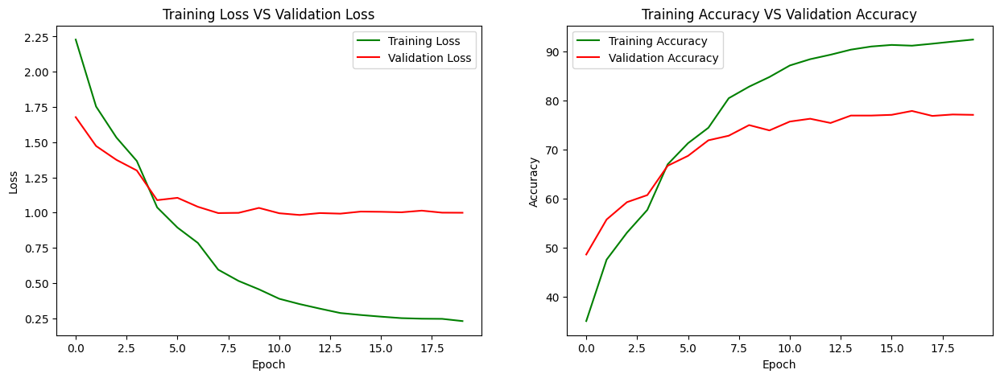

In [14]:
import matplotlib.pyplot as plt
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (15, 5))
ax1.plot(losses, c = 'green')
ax1.plot(val_losses, c = 'red')
ax1.set_xlabel("Epoch")
ax1.set_ylabel("Loss")
ax1.set_title("Training Loss VS Validation Loss")
ax1.legend(['Training Loss', 'Validation Loss'])

ax2.plot(accuracies, c = 'green')
ax2.plot(val_accuracies, c = 'red')
ax2.set_xlabel("Epoch")
ax2.set_ylabel("Accuracy")
ax2.set_title("Training Accuracy VS Validation Accuracy")
ax2.legend(['Training Accuracy', 'Validation Accuracy'])
plt.show()

In [15]:
test_folder = os.path.join(dataset, 'SkinDisease', 'SkinDisease', 'test')
test_dataset = ImageFolder(test_folder, transform = test_transformer)
test_loader = DataLoader(test_dataset, shuffle = True, batch_size = 32)
reversed = {vars: keys for keys, vars in test_dataset.class_to_idx.items()}

In [18]:
model.to(device)
model.eval()
running_loss = 0.0
correct = 0
total = 0

with torch.no_grad():
    for xb, yb in test_loader:
        xb, yb = xb.to(device), yb.to(device)
        y_pred = model(xb)
        loss = criterion(y_pred, yb)

        running_loss += loss.item()
        _, predicted = torch.max(y_pred, 1)
        correct += (predicted == yb).sum().item()
        total += yb.size(0)

avg_loss = running_loss / len(test_loader)
accuracy = 100 * correct / total

print(f"Test Loss: {avg_loss:.4f} - Test Accuracy: {accuracy:.2f}%")

Test Loss: 1.0241 - Test Accuracy: 76.78%


In [17]:
for xb, yb in test_loader:
  model.eval()
  xb = xb.to(device)
  yb = yb.to(device)
  y_pred = model(xb)
  idx = torch.argmax(y_pred, dim = -1)

  predicted = [reversed[i.item()] for i in idx]
  actual = [reversed[i.item()] for i in yb]
  for i, j in zip(predicted, actual):
    print(f"Predicted: {i} ---> True: {j}")
  break

Predicted: Benign_tumors ---> True: Benign_tumors
Predicted: Rosacea ---> True: Rosacea
Predicted: Psoriasis ---> True: Psoriasis
Predicted: Benign_tumors ---> True: Benign_tumors
Predicted: Vascular_Tumors ---> True: Moles
Predicted: Eczema ---> True: Tinea
Predicted: Moles ---> True: Moles
Predicted: Bullous ---> True: Tinea
Predicted: Benign_tumors ---> True: Benign_tumors
Predicted: Psoriasis ---> True: Psoriasis
Predicted: Warts ---> True: Warts
Predicted: Lupus ---> True: Lupus
Predicted: Vitiligo ---> True: Vitiligo
Predicted: Seborrh_Keratoses ---> True: Seborrh_Keratoses
Predicted: Acne ---> True: Acne
Predicted: Vasculitis ---> True: Vasculitis
Predicted: Psoriasis ---> True: Psoriasis
Predicted: Infestations_Bites ---> True: Infestations_Bites
Predicted: Sun_Sunlight_Damage ---> True: Sun_Sunlight_Damage
Predicted: Psoriasis ---> True: Eczema
Predicted: Vascular_Tumors ---> True: Vascular_Tumors
Predicted: Psoriasis ---> True: Infestations_Bites
Predicted: Unknown_Normal ---

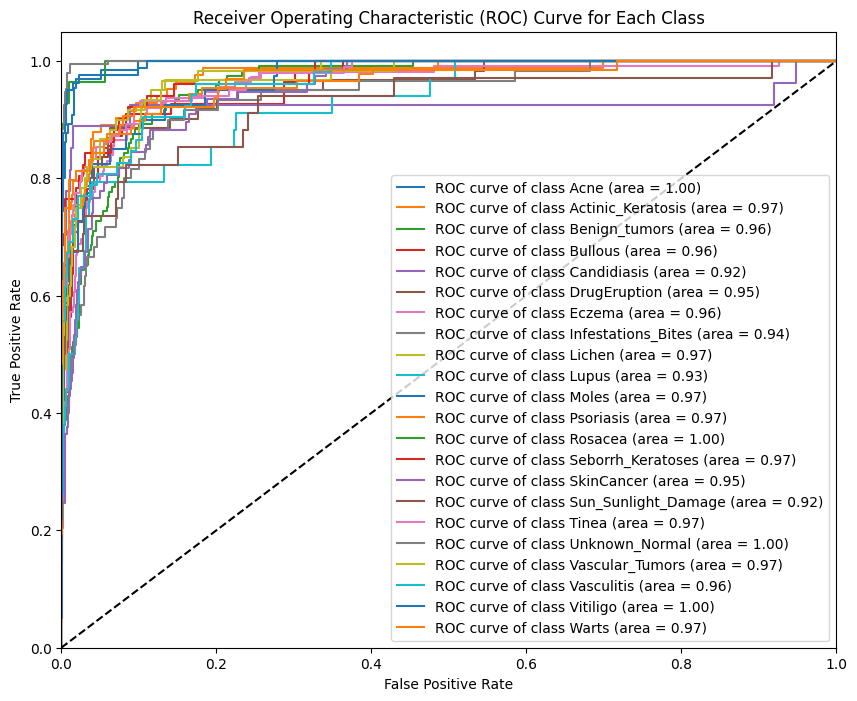

In [23]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

model.eval()
y_true = []
y_scores = []

with torch.no_grad():
    for xb, yb in test_loader:
        xb = xb.to(device)
        y_pred = model(xb)
        y_true.extend(yb.cpu().numpy())
        y_scores.extend(y_pred.cpu().numpy())

y_true = np.array(y_true)
y_scores = np.array(y_scores)

# Binarize the true labels
n_classes = len(classes)
y_true_binarized = label_binarize(y_true, classes=np.arange(n_classes))


fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_binarized[:, i], y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(10, 8))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'ROC curve of class {classes[i]} (area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Each Class')
plt.legend(loc="lower right")
plt.show()

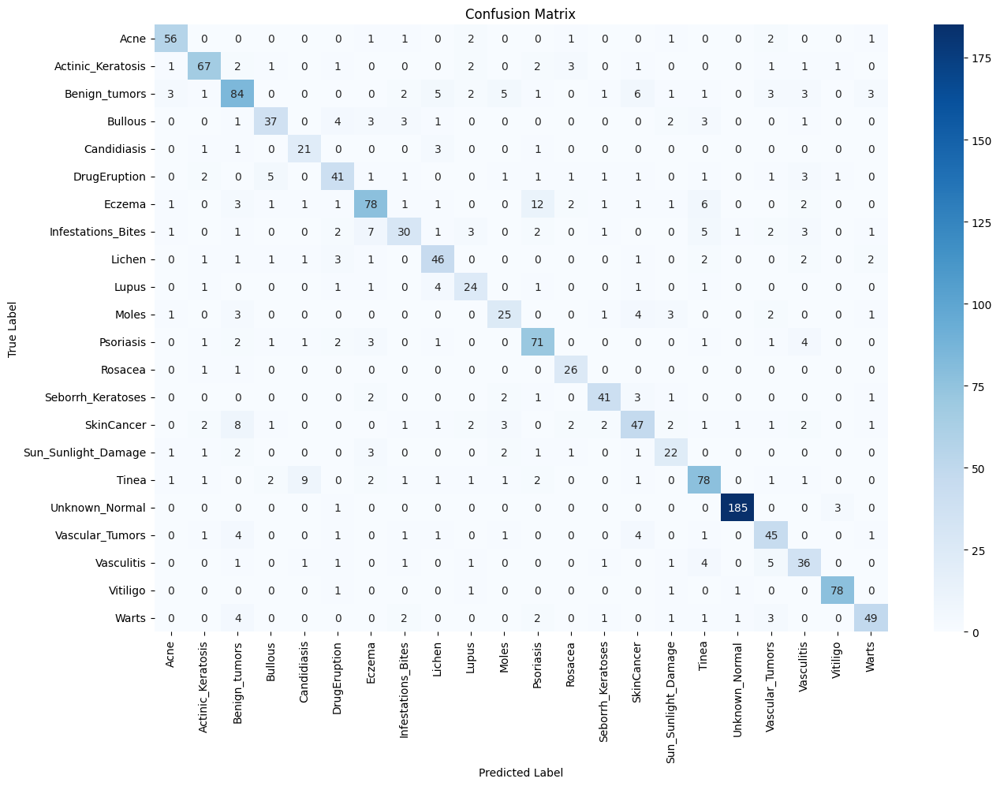

In [24]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for xb, yb in test_loader:
        xb = xb.to(device)
        y_pred_tensor = model(xb)
        _, predicted = torch.max(y_pred_tensor, 1)
        y_true.extend(yb.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(15, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

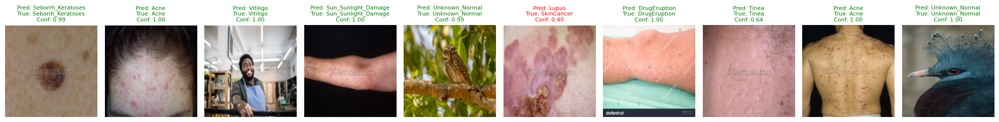

In [25]:
import random
import math

model.eval()
num_images_to_show = 10
fig, axes = plt.subplots(1, num_images_to_show, figsize=(20, 3))


random_indices = random.sample(range(len(test_dataset)), num_images_to_show)

with torch.no_grad():
    for i, idx in enumerate(random_indices):
        image, true_label = test_dataset[idx]
        image = image.unsqueeze(0).to(device)

        y_pred_tensor = model(image)
        probabilities = torch.softmax(y_pred_tensor, dim=1)
        confidence, predicted_class_index = torch.max(probabilities, 1)

        predicted_label = reversed[predicted_class_index.item()]
        true_label_name = reversed[true_label]


        ax = axes[i]

        img_plot = image.squeeze(0).cpu().numpy().transpose((1, 2, 0))

        mean = np.array([0.485]*3)
        std = np.array([0.229]*3)
        img_plot = std * img_plot + mean
        img_plot = np.clip(img_plot, 0, 1)


        ax.imshow(img_plot)
        color = "green" if predicted_label == true_label_name else "red"
        title = f"Pred: {predicted_label}\nTrue: {true_label_name}\nConf: {confidence.item():.2f}"
        ax.set_title(title, color=color, fontsize=8)
        ax.axis('off')

plt.tight_layout()
plt.show()

In [21]:
import os
file_size = os.path.getsize('skin_disease_model_state_dict.pth')
print(f"File size: {file_size/1024/1024}MB.")

File size: 15.686380386352539MB.
